In [1]:
import pandas as pd
import numpy as np
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, log_loss

# Import Local funcs
import sys
sys.path.append('../')
from utils.utils import *

In [2]:
X, y = get_training()

In [4]:
# Change respionse to binary
y = (y > 0).astype(int)
y.label.value_counts()

label
1    47332
0      668
Name: count, dtype: int64

In [5]:
X_obj_dropped = X.select_dtypes(exclude=['object'])
X_train, X_test, y_train, y_test = train_test_split(X_obj_dropped, y, test_size = 0.3, random_state = 42)

In [55]:
d_train = lgb.Dataset(X_train, label=y_train)
d_test = lgb.Dataset(X_test, label=y_test, reference=d_train)

In [56]:
params = {
    "boosting_type": "gbdt",
    "objective": "multiclass",
    "metric": "multi_logloss",

    #"num_leaves": 10,
    # "max_depth": 5,
    "learning_rate": 0.01,
    #"n_estimators": 1000,
    #"subsample_for_bin": 200000,
    #"class_weight"='balanced',
    #"min_child_samples": 20,
    #"reg_alpha": 0.1,
    #"reg_lambda": 0.1,
    #'feature_fraction': 0.8,
    #'bagging_fraction': 0.8,
    #'bagging_freq': 5,
    #"is_unbalance": True,                
    
    "boost_from_average": True,
    "num_class" : 2,
    "verbose": 1,
}

model = lgb.train(
    params,
    d_train,
    num_boost_round=10000,
    valid_sets=d_test,
    callbacks=[lgb.early_stopping(50), ]
)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8403
[LightGBM] [Info] Number of data points in the train set: 33600, number of used features: 420
[LightGBM] [Info] Start training from score -0.013906
[LightGBM] [Info] Start training from score -4.282397
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[315]	valid_0's multi_logloss: 0.0527984


In [57]:
# Get Log Loss
y_pred = model.predict(X_test)
log_loss(y_test, y_pred)


0.05279844095518246

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

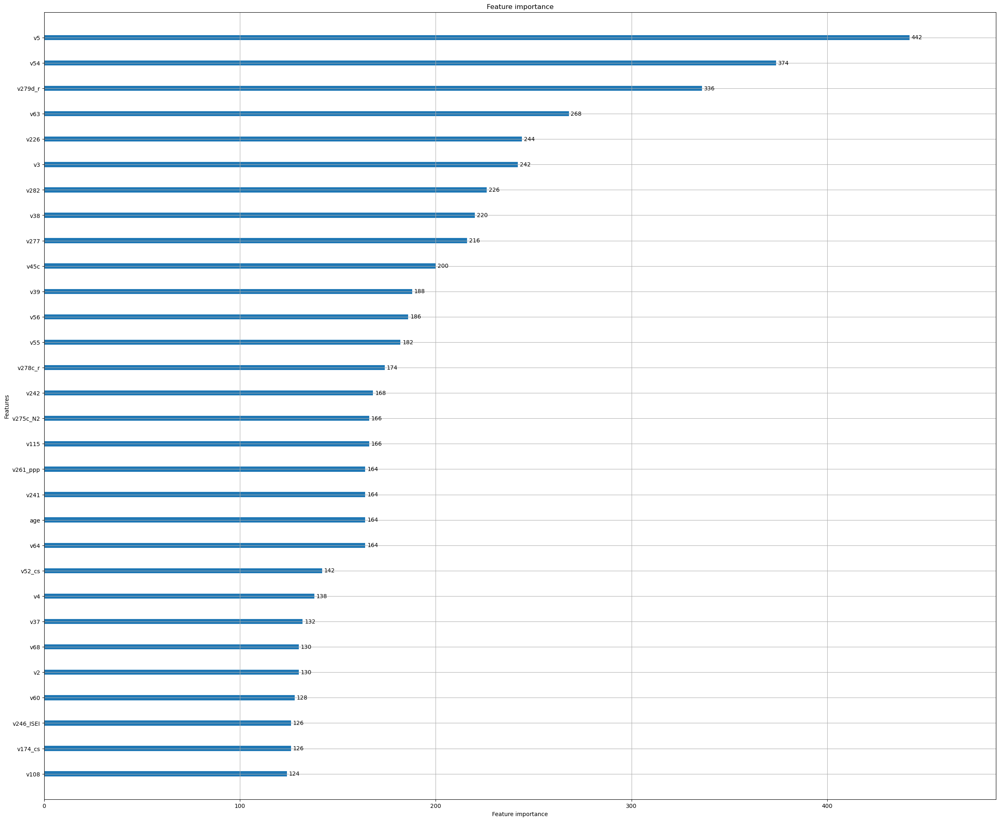

In [61]:
lgb.plot_importance(model, max_num_features=10, importance_type='split', figsize=(30,25))

# Dimensionality Reduction

In [7]:
import seaborn as sn
import matplotlib.pyplot as plt
import prince

In [8]:
df = X_obj_dropped.copy()
df['Target'] = y
df.head()

,year,fw_start,fw_end,country,v1,v2,v3,v4,v5,v7,...,v278b,v278c_r,v279a,v279b,v279c_r,v279d_r,v280,v281a_r,v282,Target
id,,,,,,,,,,,,,,,,,,,,,
0,2020,202011,202011,804,2,1,2,2,3,2,...,45,14.45,15,40,15.40,55,1,475,32,1
1,2018,201809,201811,688,2,1,2,2,3,2,...,12,17.12,18,25,18.25,73,2,397,3,1
2,2017,201706,201803,352,2,2,1,1,2,2,...,58,15.58,13,20,13.20,-5,2,72,87,1
3,2021,202105,202110,428,1,2,1,1,2,2,...,42,8.42,8,51,8.51,9,1,256,5157,1
4,2018,201801,201805,40,1,1,2,2,3,2,...,51,12.51,13,53,13.53,62,1,158,64,1


In [36]:
df.dropna(inplace=True)
pca = prince.PCA()
pca = pca.fit(df)

In [12]:
pca.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,28.439,6.76%,6.76%
1,18.982,4.51%,11.26%


In [37]:
pca.plot(df)

alt.LayerChart(...)

In [10]:
import altair as alt
alt.data_transformers.enable("vegafusion")

DataTransformerRegistry.enable('vegafusion')

In [15]:
mca = prince.MCA()
mca = mca.fit(df)
mca.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.137,0.42%,0.42%
1,0.106,0.32%,0.74%


In [17]:
mca.plot(df)

alt.LayerChart(...)

In [40]:
df.set_index('Target', append=True, inplace=True)
pca.plot(
    df,
    x_component=0,
    y_component=1,
    color_rows_by='Target',
    #show_row_markers=True,
    #show_column_markers=True,
    show_row_labels=False,
    #row_labels_column=None,  # for DataFrames with a MultiIndex
    show_column_labels=False
)

alt.LayerChart(...)